In [7]:
import os
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
import torch.nn as nn
import torch.optim as optim
import gdown
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch

import random
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import os
import zipfile

# File ID for the zip file
zip_file_id = '1Ku0_h9O-hB7fMYCk0Q30mru8WRlbolBP'
zip_path = 'food_101_images.zip'

# Download the zip file
!gdown --id {zip_file_id} -O {zip_path}

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/')

# Check if the directory exists
directory_path = '/content/food_101_images'
if os.path.exists(directory_path):
    print(f"Directory {directory_path} exists.")
else:
    print(f"Directory {directory_path} does not exist.")

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Ku0_h9O-hB7fMYCk0Q30mru8WRlbolBP
From (redirected): https://drive.google.com/uc?id=1Ku0_h9O-hB7fMYCk0Q30mru8WRlbolBP&confirm=t&uuid=4f7d4a2a-8563-43f0-a297-0548a7d2262e
To: /content/food_101_images.zip
100% 276M/276M [00:06<00:00, 42.1MB/s]
Directory /content/food_101_images exists.


In [3]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [4]:
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from sklearn.model_selection import train_test_split

# Paths
data_dir = '/content/food_101_images'
image_size = 256

# Transforms
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

val_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

# Load full dataset with no transform to get consistent splits
full_dataset = ImageFolder(root=data_dir)
class_names = full_dataset.classes
print(f"Found classes: {class_names}")

# Split indices
train_indices, val_indices = train_test_split(
    list(range(len(full_dataset))),
    test_size=0.2,
    stratify=full_dataset.targets,
    random_state=42
)

# Create datasets with correct transforms
train_dataset = Subset(ImageFolder(root=data_dir, transform=train_transform), train_indices)
val_dataset = Subset(ImageFolder(root=data_dir, transform=val_transform), val_indices)


Found classes: ['baby_back_ribs', 'bibimbap', 'caesar_salad', 'carrot_cake', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'churros', 'club_sandwich', 'creme_brulee', 'cup_cakes', 'donuts', 'dumplings', 'french_fries', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'greek_salad', 'grilled_salmon', 'guacamole', 'hamburger', 'hot_dog', 'ice_cream', 'lasagna', 'macaroni_and_cheese', 'macarons', 'mussels', 'nachos', 'omelette', 'onion_rings', 'oysters', 'paella', 'pancakes', 'panna_cotta', 'pizza', 'pork_chop', 'prime_rib', 'pulled_pork_sandwich', 'ramen', 'red_velvet_cake', 'sashimi', 'scallops', 'spaghetti_carbonara', 'spring_rolls', 'steak', 'strawberry_shortcake', 'sushi', 'tacos', 'takoyaki', 'tiramisu', 'waffles']


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 139MB/s]


Epoch 1, Train Loss: 3.9773, Train Accuracy: 3.77%
Epoch 1, Val Loss: 3.8476, Val Accuracy: 10.45%


Epoch 2, Train Loss: 3.7829, Train Accuracy: 10.50%
Epoch 2, Val Loss: 3.6274, Val Accuracy: 22.64%


Epoch 3, Train Loss: 3.5739, Train Accuracy: 17.30%
Epoch 3, Val Loss: 3.3848, Val Accuracy: 26.09%


Epoch 4, Train Loss: 3.3387, Train Accuracy: 22.52%
Epoch 4, Val Loss: 3.1177, Val Accuracy: 34.45%


Epoch 5, Train Loss: 3.1209, Train Accuracy: 28.02%
Epoch 5, Val Loss: 2.9163, Val Accuracy: 35.27%


Epoch 6, Train Loss: 2.9298, Train Accuracy: 30.14%
Epoch 6, Val Loss: 2.7272, Val Accuracy: 37.82%


Epoch 7, Train Loss: 2.7837, Train Accuracy: 33.09%
Epoch 7, Val Loss: 2.5827, Val Accuracy: 40.91%


Epoch 8, Train Loss: 2.6594, Train Accuracy: 35.59%
Epoch 8, Val Loss: 2.4652, Val Accuracy: 43.91%


Epoch 9, Train Loss: 2.5294, Train Accuracy: 38.23%
Epoch 9, Val Loss: 2.3553, Val Accuracy: 43.91%


Epoch 10, Train Loss: 2.4389, Train Accuracy: 39.48%
Epoch 10, Val Loss: 2.2770, Val Accuracy: 45.27%


Epoch 11, Train Loss: 2.3536, Train Accuracy: 41.52%
Epoch 11, Val Loss: 2.2023, Val Accuracy: 45.91%


Epoch 12, Train Loss: 2.2831, Train Accuracy: 42.61%
Epoch 12, Val Loss: 2.1557, Val Accuracy: 46.36%


Epoch 13, Train Loss: 2.2314, Train Accuracy: 43.75%
Epoch 13, Val Loss: 2.0763, Val Accuracy: 49.55%


Epoch 14, Train Loss: 2.1827, Train Accuracy: 44.93%
Epoch 14, Val Loss: 2.0548, Val Accuracy: 48.09%


Epoch 15, Train Loss: 2.1064, Train Accuracy: 46.80%
Epoch 15, Val Loss: 2.0308, Val Accuracy: 47.91%


Epoch 16, Train Loss: 2.0974, Train Accuracy: 46.05%
Epoch 16, Val Loss: 1.9619, Val Accuracy: 52.00%


Epoch 17, Train Loss: 2.0507, Train Accuracy: 47.00%
Epoch 17, Val Loss: 1.9620, Val Accuracy: 49.18%


Epoch 18, Train Loss: 2.0135, Train Accuracy: 47.55%
Epoch 18, Val Loss: 1.9297, Val Accuracy: 49.91%


Epoch 19, Train Loss: 1.9734, Train Accuracy: 47.93%
Epoch 19, Val Loss: 1.8946, Val Accuracy: 50.55%


Epoch 20, Train Loss: 1.9333, Train Accuracy: 50.27%
Epoch 20, Val Loss: 1.8679, Val Accuracy: 51.27%


Epoch 21, Train Loss: 1.8951, Train Accuracy: 50.07%
Epoch 21, Val Loss: 1.8508, Val Accuracy: 51.64%


Epoch 22, Train Loss: 1.8866, Train Accuracy: 49.98%
Epoch 22, Val Loss: 1.8295, Val Accuracy: 52.36%


Epoch 23, Train Loss: 1.8594, Train Accuracy: 51.11%
Epoch 23, Val Loss: 1.8220, Val Accuracy: 51.82%


Epoch 24, Train Loss: 1.8479, Train Accuracy: 50.93%
Epoch 24, Val Loss: 1.8134, Val Accuracy: 53.55%


Epoch 25, Train Loss: 1.7908, Train Accuracy: 52.84%
Epoch 25, Val Loss: 1.7742, Val Accuracy: 53.27%


Epoch 26, Train Loss: 1.8086, Train Accuracy: 52.68%
Epoch 26, Val Loss: 1.7778, Val Accuracy: 52.27%


Epoch 27, Train Loss: 1.7699, Train Accuracy: 53.52%
Epoch 27, Val Loss: 1.7685, Val Accuracy: 53.45%


Epoch 28, Train Loss: 1.7771, Train Accuracy: 52.39%
Epoch 28, Val Loss: 1.7316, Val Accuracy: 54.27%


Epoch 29, Train Loss: 1.7536, Train Accuracy: 52.84%
Epoch 29, Val Loss: 1.7205, Val Accuracy: 54.55%


Epoch 30, Train Loss: 1.6988, Train Accuracy: 56.16%
Epoch 30, Val Loss: 1.7713, Val Accuracy: 52.82%


Epoch 31, Train Loss: 1.7121, Train Accuracy: 54.09%
Epoch 31, Val Loss: 1.7305, Val Accuracy: 53.45%


Epoch 32, Train Loss: 1.6778, Train Accuracy: 55.45%
Epoch 32, Val Loss: 1.7107, Val Accuracy: 54.36%


Epoch 33, Train Loss: 1.6699, Train Accuracy: 55.27%
Epoch 33, Val Loss: 1.6975, Val Accuracy: 54.73%


Epoch 34, Train Loss: 1.6821, Train Accuracy: 54.48%
Epoch 34, Val Loss: 1.7143, Val Accuracy: 54.91%


Epoch 35, Train Loss: 1.6339, Train Accuracy: 56.27%
Epoch 35, Val Loss: 1.6998, Val Accuracy: 54.36%


Epoch 36, Train Loss: 1.6306, Train Accuracy: 56.23%
Epoch 36, Val Loss: 1.6947, Val Accuracy: 54.91%


Epoch 37, Train Loss: 1.6199, Train Accuracy: 55.59%
Epoch 37, Val Loss: 1.6725, Val Accuracy: 55.18%


Epoch 38, Train Loss: 1.5851, Train Accuracy: 56.82%
Epoch 38, Val Loss: 1.6906, Val Accuracy: 54.09%


Epoch 39, Train Loss: 1.6011, Train Accuracy: 56.93%
Epoch 39, Val Loss: 1.7002, Val Accuracy: 53.82%


Epoch 40, Train Loss: 1.5846, Train Accuracy: 57.50%
Epoch 40, Val Loss: 1.7032, Val Accuracy: 54.91%


Epoch 41, Train Loss: 1.5646, Train Accuracy: 57.82%
Epoch 41, Val Loss: 1.6470, Val Accuracy: 55.64%


Epoch 42, Train Loss: 1.5631, Train Accuracy: 58.11%
Epoch 42, Val Loss: 1.6735, Val Accuracy: 54.91%


Epoch 43, Train Loss: 1.5462, Train Accuracy: 57.89%
Epoch 43, Val Loss: 1.6519, Val Accuracy: 55.27%


Epoch 44, Train Loss: 1.5319, Train Accuracy: 57.84%
Epoch 44, Val Loss: 1.6548, Val Accuracy: 55.27%


Epoch 45, Train Loss: 1.4957, Train Accuracy: 58.66%
Epoch 45, Val Loss: 1.6666, Val Accuracy: 54.27%


Epoch 46, Train Loss: 1.5032, Train Accuracy: 58.95%
Epoch 46, Val Loss: 1.6687, Val Accuracy: 54.82%


Epoch 47, Train Loss: 1.5060, Train Accuracy: 58.93%
Epoch 47, Val Loss: 1.6473, Val Accuracy: 54.82%


Epoch 48, Train Loss: 1.4842, Train Accuracy: 59.70%
Epoch 48, Val Loss: 1.6400, Val Accuracy: 54.64%


Epoch 49, Train Loss: 1.5187, Train Accuracy: 58.14%
Epoch 49, Val Loss: 1.6675, Val Accuracy: 54.18%


Epoch 50, Train Loss: 1.4555, Train Accuracy: 60.07%
Epoch 50, Val Loss: 1.6409, Val Accuracy: 55.64%


Epoch 51, Train Loss: 1.4607, Train Accuracy: 59.55%
Epoch 51, Val Loss: 1.6554, Val Accuracy: 55.00%


Epoch 52, Train Loss: 1.4833, Train Accuracy: 59.52%
Epoch 52, Val Loss: 1.6273, Val Accuracy: 55.64%


Epoch 53, Train Loss: 1.4538, Train Accuracy: 60.75%
Epoch 53, Val Loss: 1.6352, Val Accuracy: 54.45%


Epoch 54, Train Loss: 1.4253, Train Accuracy: 60.86%
Epoch 54, Val Loss: 1.6404, Val Accuracy: 55.73%


Epoch 55, Train Loss: 1.4365, Train Accuracy: 61.02%
Epoch 55, Val Loss: 1.6195, Val Accuracy: 55.82%


Epoch 56, Train Loss: 1.4171, Train Accuracy: 60.55%
Epoch 56, Val Loss: 1.6329, Val Accuracy: 55.55%


Epoch 57, Train Loss: 1.4418, Train Accuracy: 60.68%
Epoch 57, Val Loss: 1.6366, Val Accuracy: 55.55%


Epoch 58, Train Loss: 1.4242, Train Accuracy: 60.95%
Epoch 58, Val Loss: 1.6407, Val Accuracy: 54.55%


Epoch 59, Train Loss: 1.4196, Train Accuracy: 60.48%
Epoch 59, Val Loss: 1.6432, Val Accuracy: 54.73%


Epoch 60, Train Loss: 1.3959, Train Accuracy: 60.50%
Epoch 60, Val Loss: 1.6303, Val Accuracy: 55.18%


Epoch 61, Train Loss: 1.3909, Train Accuracy: 60.61%
Epoch 61, Val Loss: 1.6339, Val Accuracy: 55.00%


Epoch 62, Train Loss: 1.3905, Train Accuracy: 60.82%
Epoch 62, Val Loss: 1.5993, Val Accuracy: 56.55%


Epoch 63, Train Loss: 1.3764, Train Accuracy: 61.59%
Epoch 63, Val Loss: 1.6268, Val Accuracy: 55.18%


Epoch 64, Train Loss: 1.3937, Train Accuracy: 60.36%
Epoch 64, Val Loss: 1.6396, Val Accuracy: 55.45%


Epoch 65, Train Loss: 1.3425, Train Accuracy: 62.66%
Epoch 65, Val Loss: 1.6211, Val Accuracy: 56.18%


Epoch 66, Train Loss: 1.3805, Train Accuracy: 61.45%
Epoch 66, Val Loss: 1.5993, Val Accuracy: 55.82%


Epoch 67, Train Loss: 1.3459, Train Accuracy: 62.89%
Epoch 67, Val Loss: 1.6368, Val Accuracy: 55.09%


Epoch 68, Train Loss: 1.3444, Train Accuracy: 61.14%
Epoch 68, Val Loss: 1.6184, Val Accuracy: 55.55%


Epoch 69, Train Loss: 1.3296, Train Accuracy: 62.98%
Epoch 69, Val Loss: 1.6092, Val Accuracy: 56.45%


Epoch 70, Train Loss: 1.3380, Train Accuracy: 62.05%
Epoch 70, Val Loss: 1.6336, Val Accuracy: 55.64%


Epoch 71, Train Loss: 1.3410, Train Accuracy: 62.70%
Epoch 71, Val Loss: 1.6132, Val Accuracy: 56.64%


Epoch 72, Train Loss: 1.3255, Train Accuracy: 62.82%
Epoch 72, Val Loss: 1.6020, Val Accuracy: 55.09%


Epoch 73, Train Loss: 1.3223, Train Accuracy: 62.80%
Epoch 73, Val Loss: 1.6031, Val Accuracy: 56.55%


Epoch 74, Train Loss: 1.3222, Train Accuracy: 62.66%
Epoch 74, Val Loss: 1.6071, Val Accuracy: 56.00%


Epoch 75, Train Loss: 1.2760, Train Accuracy: 64.50%
Epoch 75, Val Loss: 1.6150, Val Accuracy: 55.82%


Epoch 76, Train Loss: 1.2859, Train Accuracy: 63.64%
Epoch 76, Val Loss: 1.6144, Val Accuracy: 55.55%


Epoch 77, Train Loss: 1.2682, Train Accuracy: 64.32%
Epoch 77, Val Loss: 1.6088, Val Accuracy: 55.91%


Epoch 78, Train Loss: 1.2806, Train Accuracy: 63.61%
Epoch 78, Val Loss: 1.6087, Val Accuracy: 56.00%


Epoch 79, Train Loss: 1.2943, Train Accuracy: 63.36%
Epoch 79, Val Loss: 1.6255, Val Accuracy: 56.45%


Epoch 80, Train Loss: 1.2725, Train Accuracy: 64.50%
Epoch 80, Val Loss: 1.6283, Val Accuracy: 56.09%


Epoch 81, Train Loss: 1.2585, Train Accuracy: 64.45%
Epoch 81, Val Loss: 1.6163, Val Accuracy: 56.18%


Epoch 82, Train Loss: 1.2476, Train Accuracy: 64.86%
Epoch 82, Val Loss: 1.6052, Val Accuracy: 57.09%


Epoch 83, Train Loss: 1.2590, Train Accuracy: 64.55%
Epoch 83, Val Loss: 1.6047, Val Accuracy: 56.55%


Epoch 84, Train Loss: 1.2244, Train Accuracy: 65.70%
Epoch 84, Val Loss: 1.6137, Val Accuracy: 56.09%


Epoch 85, Train Loss: 1.2323, Train Accuracy: 65.41%
Epoch 85, Val Loss: 1.5996, Val Accuracy: 57.00%


Epoch 86, Train Loss: 1.2465, Train Accuracy: 64.55%
Epoch 86, Val Loss: 1.6139, Val Accuracy: 56.36%


Epoch 87, Train Loss: 1.2191, Train Accuracy: 65.77%
Epoch 87, Val Loss: 1.5983, Val Accuracy: 56.64%


Epoch 88, Train Loss: 1.2063, Train Accuracy: 66.14%
Epoch 88, Val Loss: 1.6079, Val Accuracy: 56.36%


Epoch 89, Train Loss: 1.2220, Train Accuracy: 65.02%
Epoch 89, Val Loss: 1.6284, Val Accuracy: 55.45%


Epoch 90, Train Loss: 1.2277, Train Accuracy: 65.95%
Epoch 90, Val Loss: 1.6120, Val Accuracy: 57.00%


Epoch 91, Train Loss: 1.2282, Train Accuracy: 64.20%
Epoch 91, Val Loss: 1.6117, Val Accuracy: 56.27%


Epoch 92, Train Loss: 1.2264, Train Accuracy: 65.61%
Epoch 92, Val Loss: 1.6120, Val Accuracy: 56.27%


Epoch 93, Train Loss: 1.2058, Train Accuracy: 66.61%
Epoch 93, Val Loss: 1.6140, Val Accuracy: 55.64%


Epoch 94, Train Loss: 1.1770, Train Accuracy: 66.11%
Epoch 94, Val Loss: 1.6306, Val Accuracy: 55.55%


Epoch 95, Train Loss: 1.1795, Train Accuracy: 67.18%
Epoch 95, Val Loss: 1.6189, Val Accuracy: 56.55%


Epoch 96, Train Loss: 1.1792, Train Accuracy: 66.36%
Epoch 96, Val Loss: 1.6216, Val Accuracy: 56.00%


Epoch 97, Train Loss: 1.1716, Train Accuracy: 66.16%
Epoch 97, Val Loss: 1.6144, Val Accuracy: 56.18%


Epoch 98, Train Loss: 1.1704, Train Accuracy: 66.98%
Epoch 98, Val Loss: 1.6044, Val Accuracy: 56.55%


Epoch 99, Train Loss: 1.1782, Train Accuracy: 66.02%
Epoch 99, Val Loss: 1.6130, Val Accuracy: 56.18%


Epoch 100, Train Loss: 1.1718, Train Accuracy: 66.43%
Epoch 100, Val Loss: 1.6189, Val Accuracy: 56.36%

Final Accuracy: 56.36%


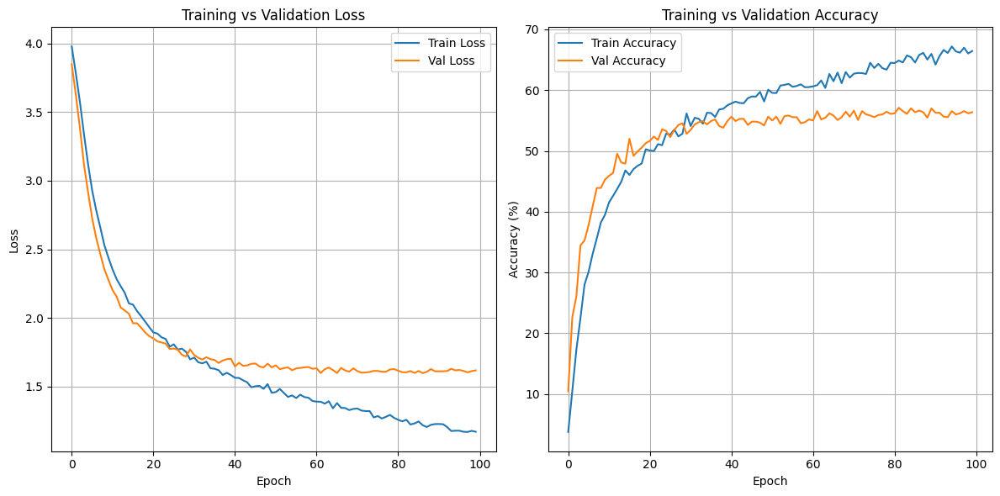

In [ ]:
from torchvision.models import resnet18

model = resnet18(pretrained=True)

# Freeze earlier layers if you want (optional)
for param in model.parameters():
    param.requires_grad = False

# Replace the classifier (fc layer)
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, len(class_names))
)

model = model.to(device)

batch_size = 32
num_epochs = 100
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


# Store losses and accuracies
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)

    for images, labels in loop:
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Loss and accuracy
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        correct_train += (predicted == labels).sum().item()
        total_train += labels.size(0)

        loop.set_postfix(loss=loss.item())

    # Average training loss and accuracy
    avg_train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * correct_train / total_train
    train_losses.append(avg_train_loss)
    train_accuracies.append(train_accuracy)

    print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%")

    # Validation loop
    model.eval()
    val_running_loss = 0.0
    correct_val = 0
    total_val = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()

            # Accuracy calculation
            _, predicted = torch.max(outputs.data, 1)
            correct_val += (predicted == labels).sum().item()
            total_val += labels.size(0)

    # Average validation loss and accuracy
    avg_val_loss = val_running_loss / len(val_loader)
    val_accuracy = 100 * correct_val / total_val
    val_losses.append(avg_val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}, Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

final_val_accuracy = val_accuracies[-1]
print()
print(f"Final Accuracy: {final_val_accuracy:.2f}%")
# Plot loss graph
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)

# Plot accuracy graph
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
from google.colab import files

# Save model
model_path = 'resnet_food101_100.pth'
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

# Download to local
files.download(model_path)

Model saved to resnet_food101_100.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

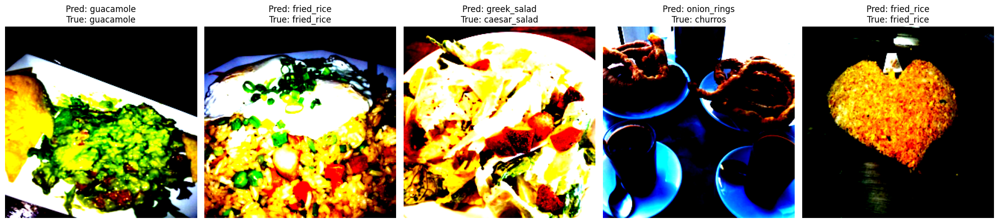

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Set model to evaluation
model.eval()

# Pick 5 random samples from val_dataset
indices = random.sample(range(len(val_dataset)), 5)
fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i, idx in enumerate(indices):
    image, label = val_dataset[idx]
    img_input = image.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(img_input)
        pred = torch.argmax(output, dim=1).item()

    axs[i].imshow(np.transpose(image.numpy(), (1, 2, 0)))
    axs[i].set_title(f"Pred: {class_names[pred]}\nTrue: {class_names[label]}")
    axs[i].axis('off')

plt.tight_layout()
plt.show()


### Loading previously trained model from .pth file

In [5]:
import torch
import torch.nn as nn
import torchvision.models as models
import gdown

# === Step 1: Download model from Google Drive ===
file_id = "1uocXE_wIJty0Efx4QV_-9iDuotrA5miY"
gdown.download(f"https://drive.google.com/uc?id={file_id}", "resnet18_food101.pth", quiet=False)

# === Step 2: Recreate same model architecture ===
from torchvision.models import resnet18
model = resnet18(weights=None)  # Disable pretrained weights

# Freeze layers if needed (optional)
for param in model.parameters():
    param.requires_grad = False

# Custom classifier same as the one used during training
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, len(class_names))  # class_names must be defined already
)

# Load state dict
model.load_state_dict(torch.load("resnet18_food101.pth", map_location=device))
model = model.to(device)
model.eval()

print("✅ Model loaded and ready for inference.")

Downloading...
From (original): https://drive.google.com/uc?id=1uocXE_wIJty0Efx4QV_-9iDuotrA5miY
From (redirected): https://drive.google.com/uc?id=1uocXE_wIJty0Efx4QV_-9iDuotrA5miY&confirm=t&uuid=7f689ed4-5efb-4b3b-8ce8-4e184869e754
To: /content/resnet18_food101.pth
100%|██████████| 46.0M/46.0M [00:01<00:00, 45.7MB/s]


✅ Model loaded and ready for inference.


In [20]:
def pred_random_images():
  # Set model to evaluation
  model.eval()

  # Pick 10 random samples from val_dataset
  indices = random.sample(range(len(val_dataset)), 10)
  fig, axs = plt.subplots(2, 5, figsize=(20, 8))

  for i, idx in enumerate(indices):
      image, label = val_dataset[idx]
      img_input = image.unsqueeze(0).to(device)

      with torch.no_grad():
          output = model(img_input)
          pred = torch.argmax(output, dim=1).item()

      # Unnormalize for display
      img_np = image.cpu().numpy()
      img_np = img_np * np.array([0.229, 0.224, 0.225])[:, None, None] + np.array([0.485, 0.456, 0.406])[:, None, None]
      img_np = np.clip(img_np, 0, 1).transpose(1, 2, 0)

      ax = axs[i // 5, i % 5]
      ax.imshow(img_np)
      ax.set_title(f"Pred: {class_names[pred]}\nTrue: {class_names[label]}")
      ax.axis('off')

  plt.tight_layout()
  plt.show()

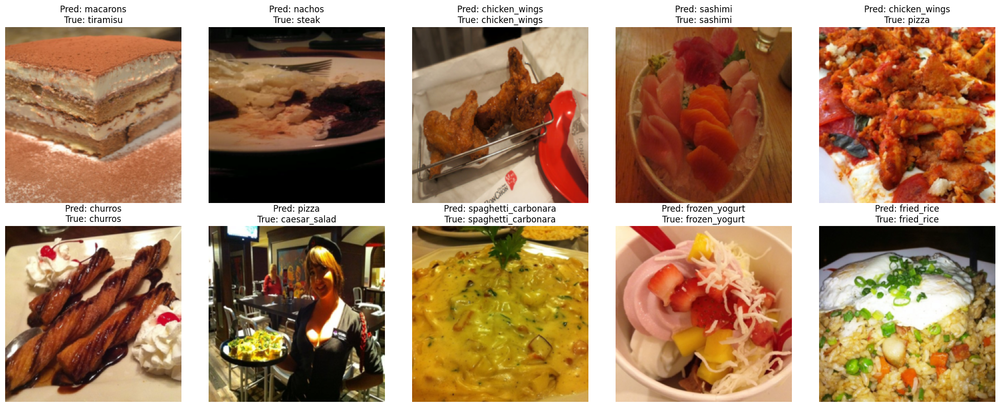

In [11]:
pred_random_images()

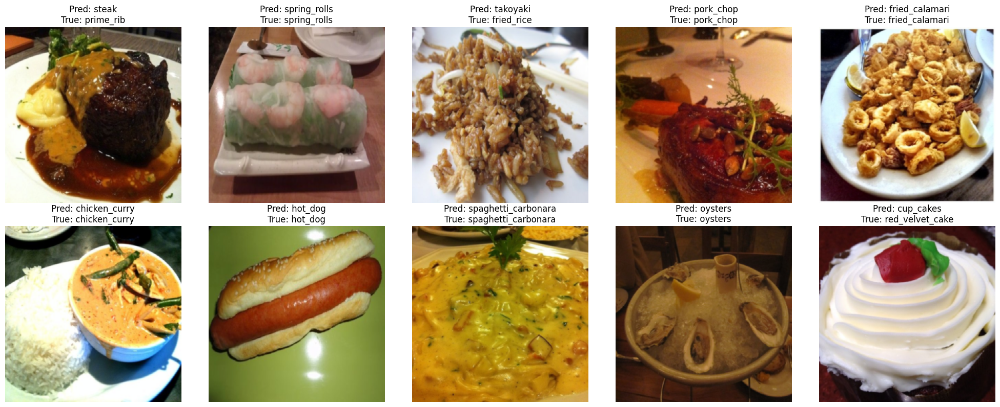

In [17]:
pred_random_images()

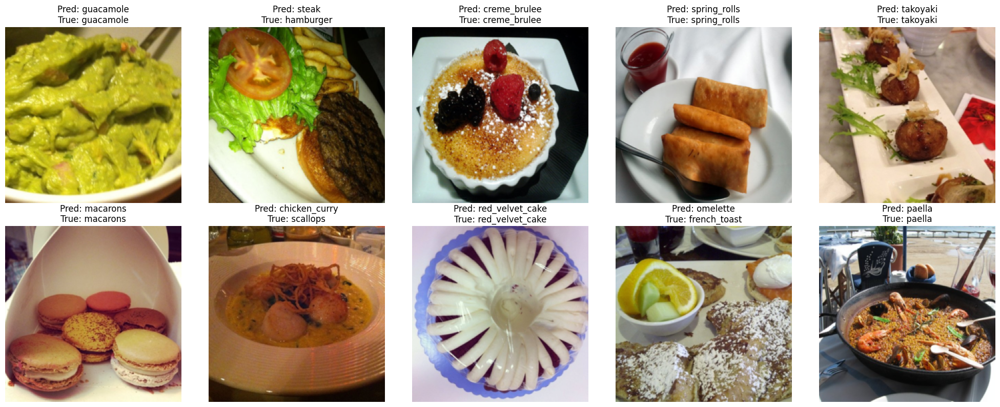

In [23]:
pred_random_images()

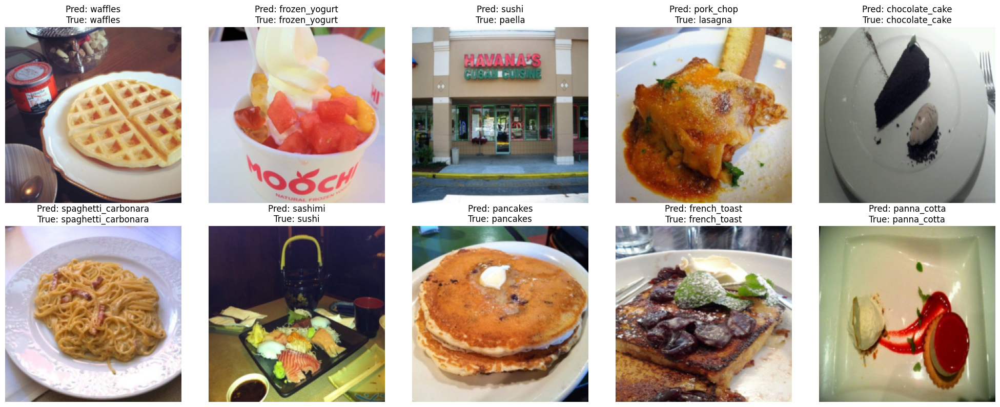

In [22]:
pred_random_images()

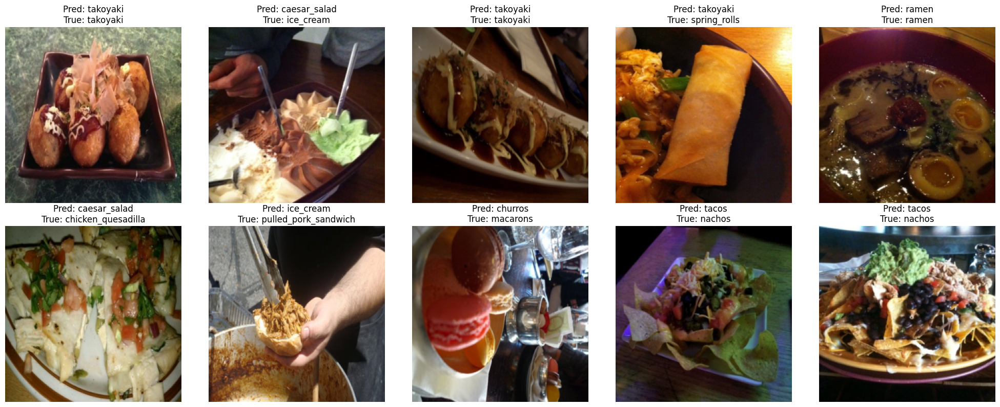

In [27]:
pred_random_images()